In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 288), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  610.617 2.80698 0.287914


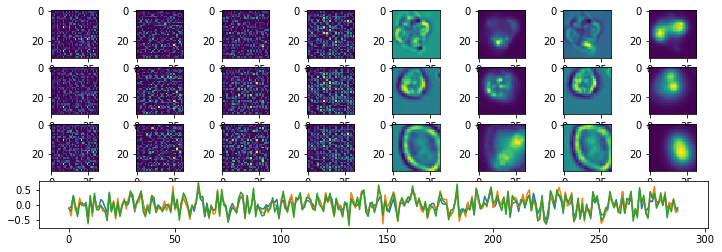

Epoch:  1 Iteration:  0 Loss:  17.5474 0.637508 0.0017136


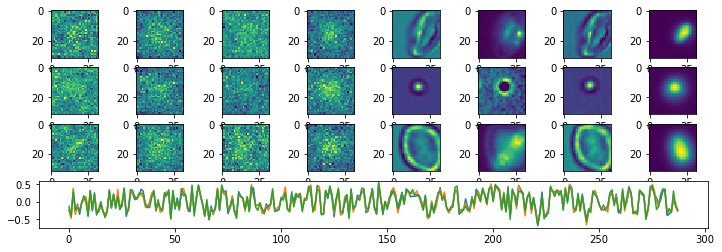

Epoch:  2 Iteration:  0 Loss:  17.1016 0.637223 0.00299779


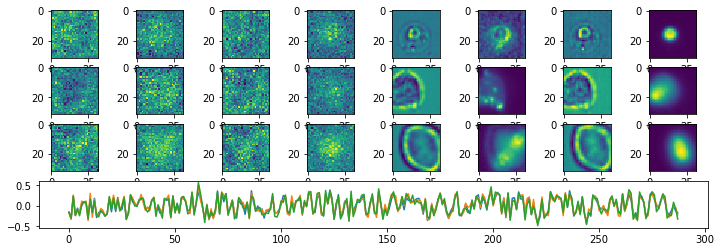

Epoch:  3 Iteration:  0 Loss:  13.1721 0.635083 0.00236434


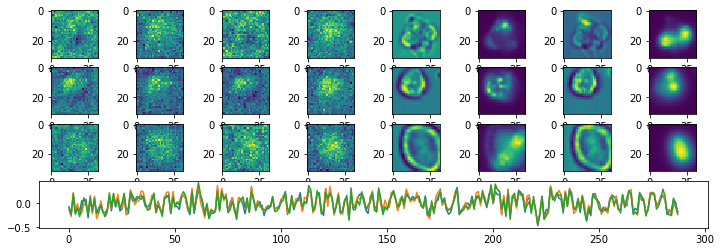

Epoch:  4 Iteration:  0 Loss:  11.6976 0.634318 0.00202948


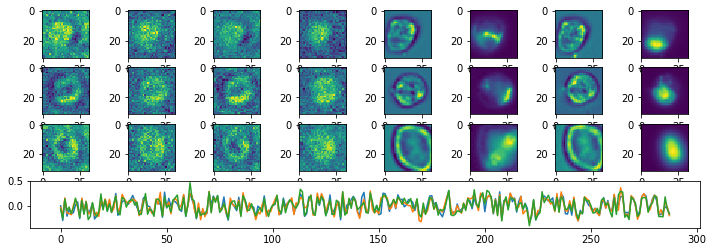

Epoch:  5 Iteration:  0 Loss:  10.6467 0.633764 0.00125191


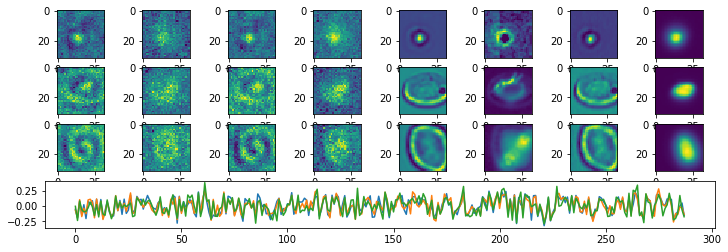

Epoch:  6 Iteration:  0 Loss:  9.74434 0.633292 0.00225005


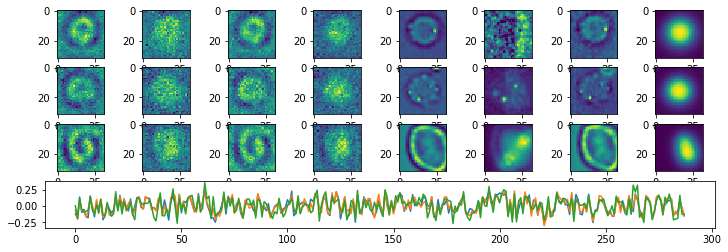

Epoch:  7 Iteration:  0 Loss:  8.78507 0.632787 0.00188851


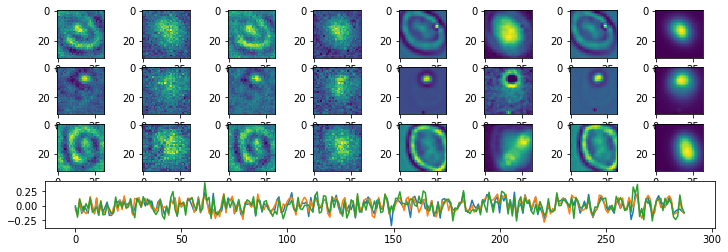

Epoch:  8 Iteration:  0 Loss:  7.9542 0.63234 0.0010691


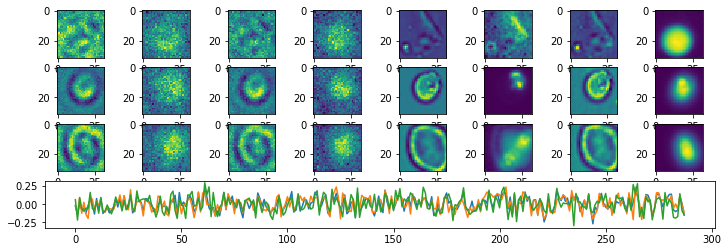

Epoch:  9 Iteration:  0 Loss:  7.76168 0.632234 0.000318438


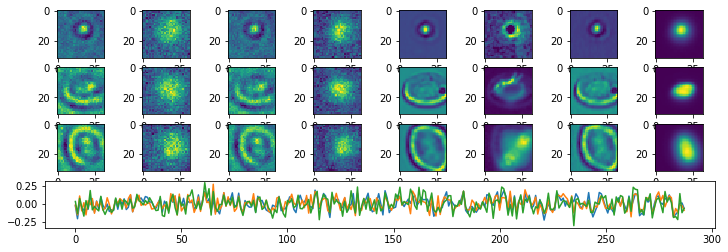

Epoch:  10 Iteration:  0 Loss:  7.33777 0.632018 0.00201628


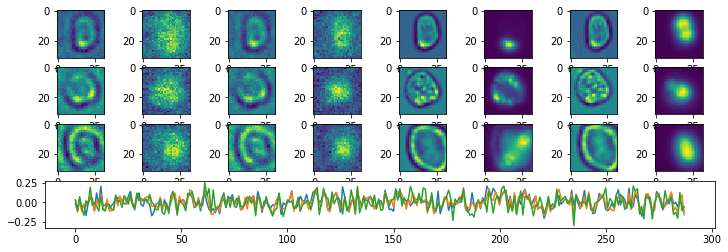

Epoch:  11 Iteration:  0 Loss:  6.73147 0.6317 0.00104061


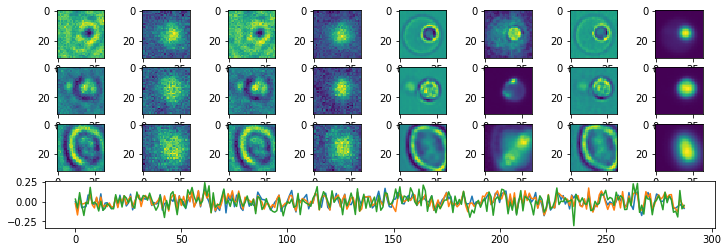

Epoch:  12 Iteration:  0 Loss:  6.37418 0.631515 0.00108951


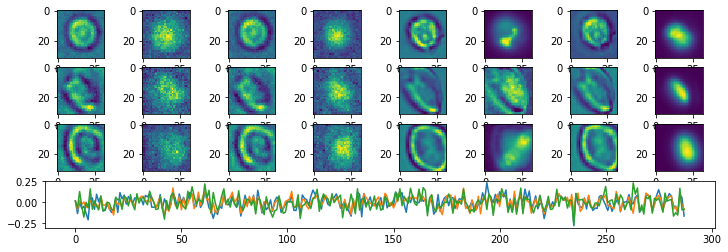

Epoch:  13 Iteration:  0 Loss:  6.57783 0.63162 0.00182998


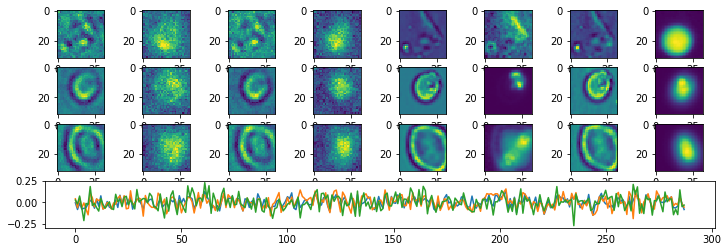

Epoch:  14 Iteration:  0 Loss:  6.02747 0.631332 0.00123066


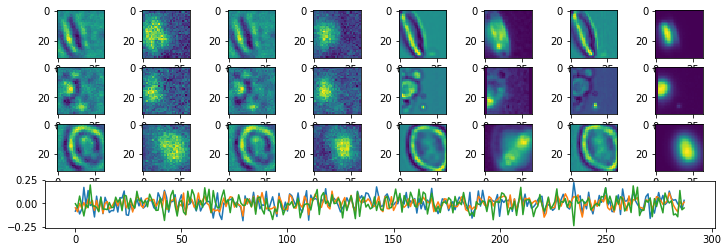

Epoch:  15 Iteration:  0 Loss:  5.7629 0.631193 0.000706375


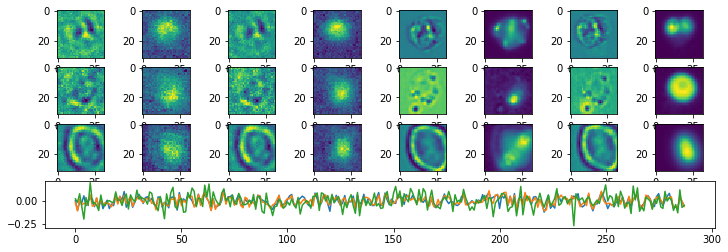

Epoch:  16 Iteration:  0 Loss:  5.58187 0.631097 0.00099054


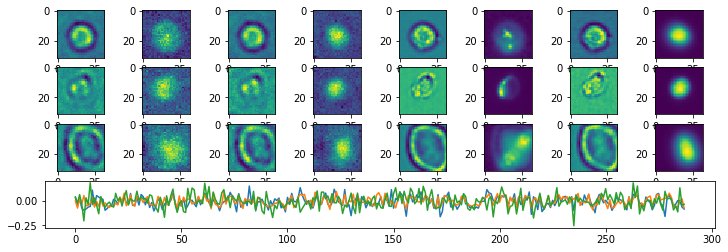

Epoch:  17 Iteration:  0 Loss:  5.43434 0.63102 0.00109589


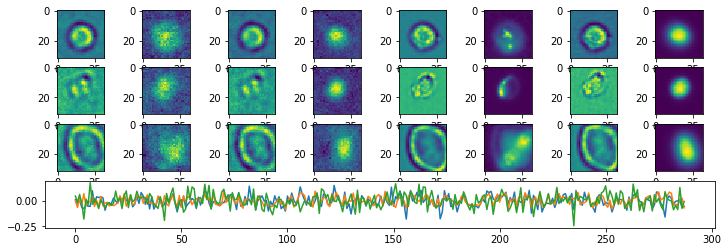

Epoch:  18 Iteration:  0 Loss:  5.16506 0.630874 0.000747442


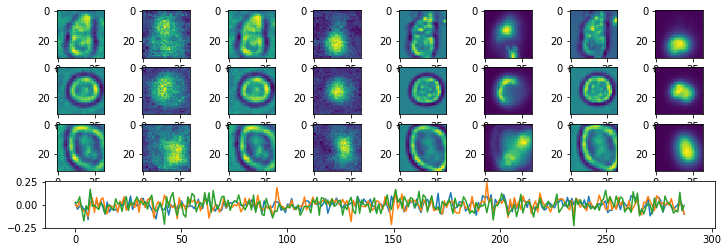

Epoch:  19 Iteration:  0 Loss:  5.12787 0.630855 0.00105718


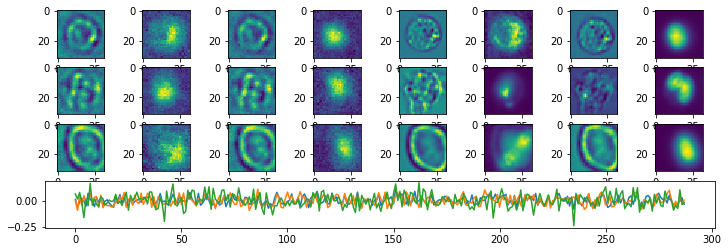

Epoch:  20 Iteration:  0 Loss:  4.82587 0.630693 0.000779271


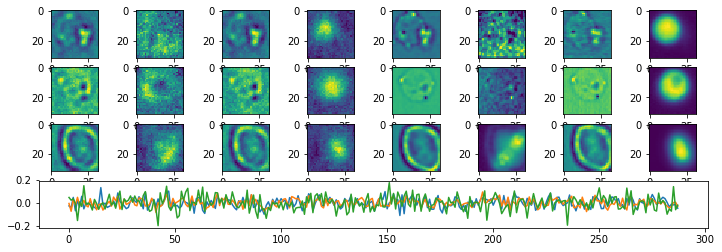

Epoch:  21 Iteration:  0 Loss:  4.73322 0.630643 0.000923246


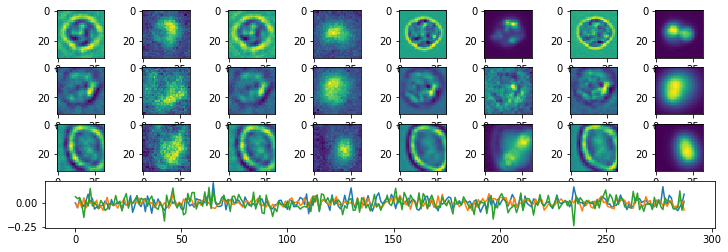

Epoch:  22 Iteration:  0 Loss:  4.56857 0.630555 0.000976622


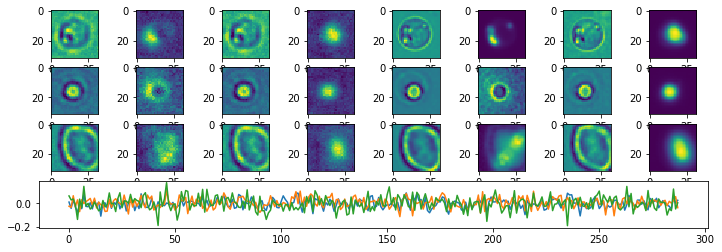

Epoch:  23 Iteration:  0 Loss:  4.49518 0.630516 0.000728995


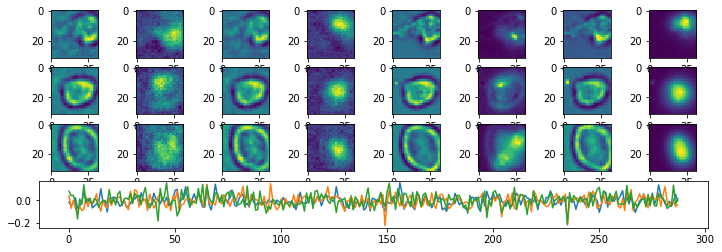

Epoch:  24 Iteration:  0 Loss:  4.37579 0.630455 0.000379056


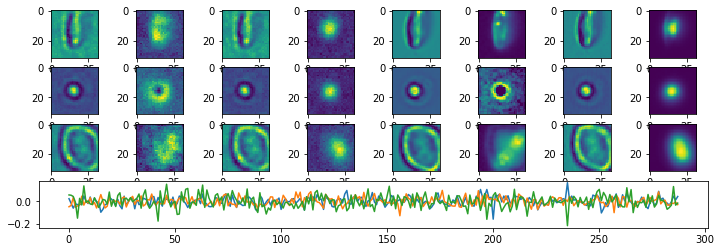

Epoch:  25 Iteration:  0 Loss:  4.33068 0.630428 0.000460893


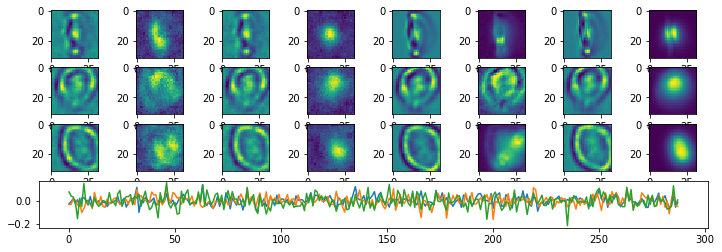

Epoch:  26 Iteration:  0 Loss:  4.2135 0.630368 0.00046128


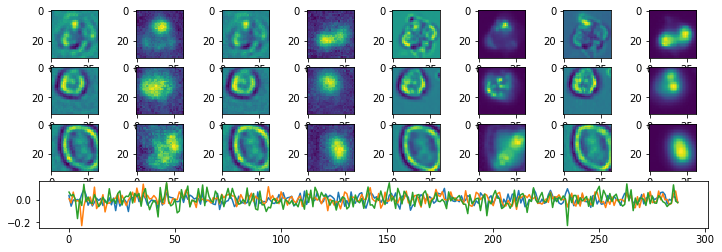

Epoch:  27 Iteration:  0 Loss:  4.162 0.63034 0.000952125


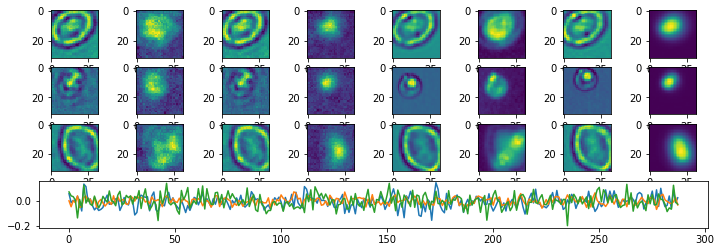

Epoch:  28 Iteration:  0 Loss:  4.08079 0.630297 0.000430286


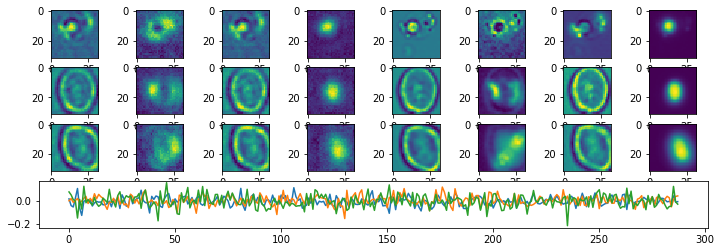

Epoch:  29 Iteration:  0 Loss:  4.05545 0.630287 5.68032e-05


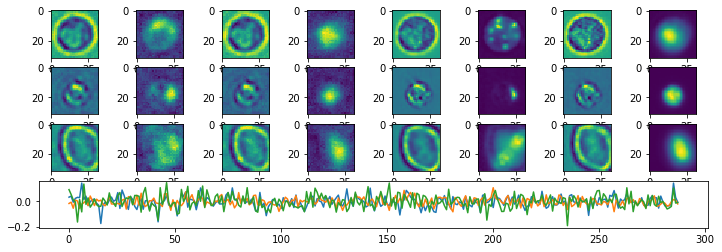

Epoch:  30 Iteration:  0 Loss:  3.95529 0.630232 0.000718325


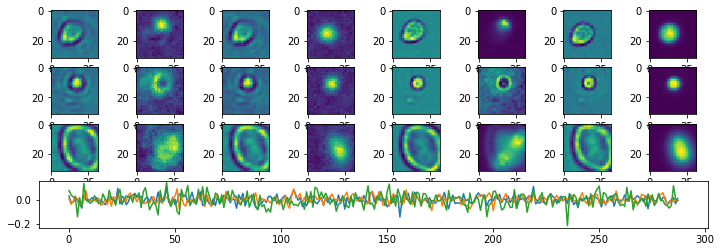

Epoch:  31 Iteration:  0 Loss:  3.88643 0.630195 0.000512481


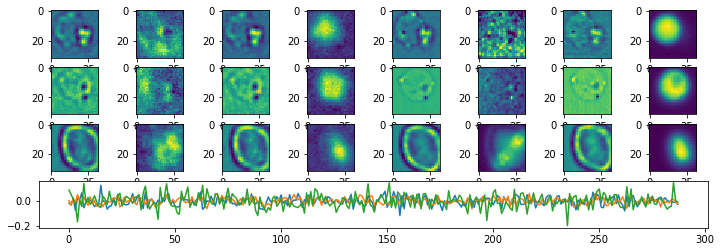

Epoch:  32 Iteration:  0 Loss:  3.93436 0.630219 0.00111809


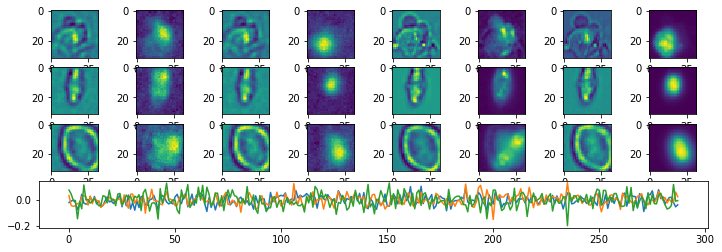

Epoch:  33 Iteration:  0 Loss:  3.75348 0.630126 0.000692576


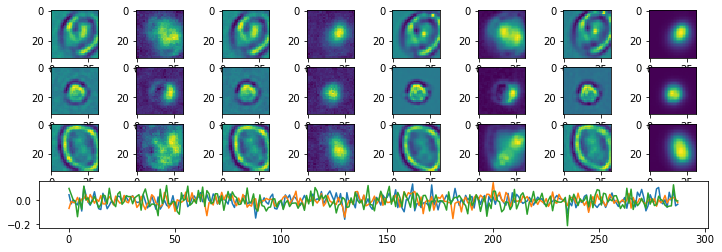

Epoch:  34 Iteration:  0 Loss:  3.72278 0.630113 0.000102609


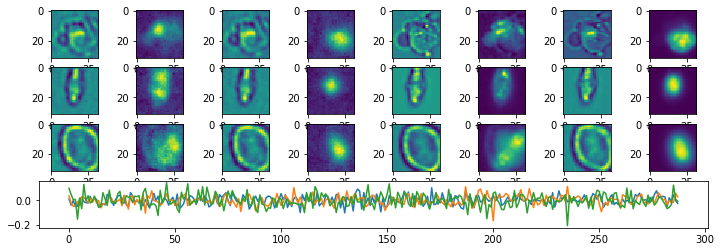

Epoch:  35 Iteration:  0 Loss:  3.6915 0.630093 0.000526249


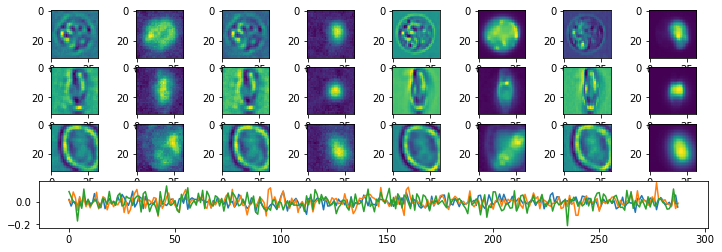

Epoch:  36 Iteration:  0 Loss:  3.64241 0.630067 5.82039e-05


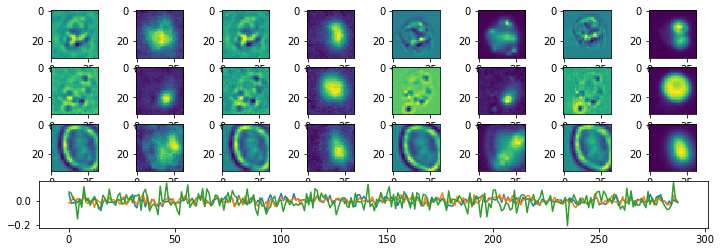

Epoch:  37 Iteration:  0 Loss:  3.55206 0.63002 0.000783741


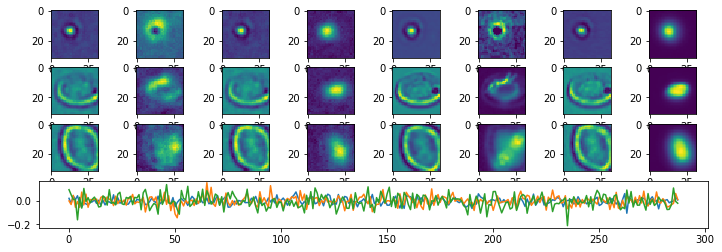

Epoch:  38 Iteration:  0 Loss:  3.51776 0.630002 0.00020805


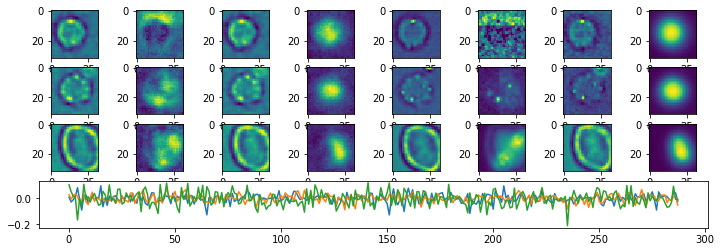

Epoch:  39 Iteration:  0 Loss:  3.49434 0.62999 0.000156581


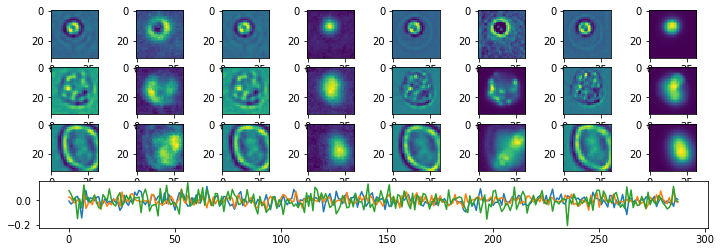

Epoch:  40 Iteration:  0 Loss:  3.37387 0.629928 0.000493646


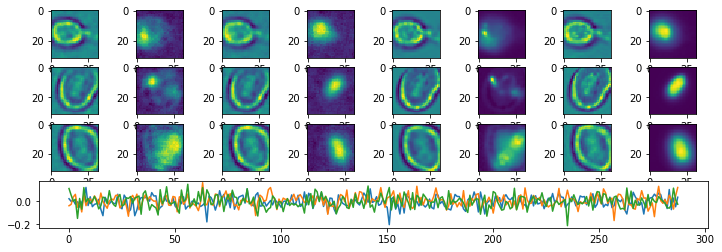

Epoch:  41 Iteration:  0 Loss:  3.35296 0.629917 0.000597298


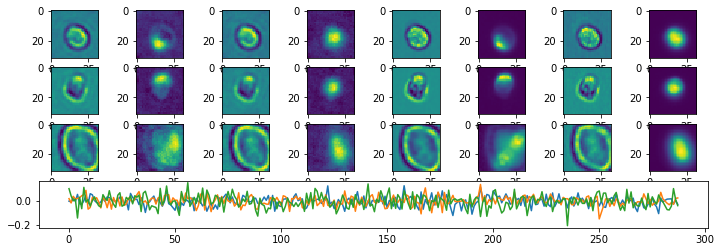

Epoch:  42 Iteration:  0 Loss:  3.32593 0.629903 0.000769466


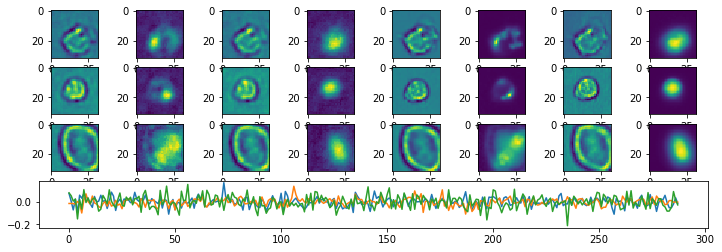

Epoch:  43 Iteration:  0 Loss:  3.26726 0.629873 0.000654995


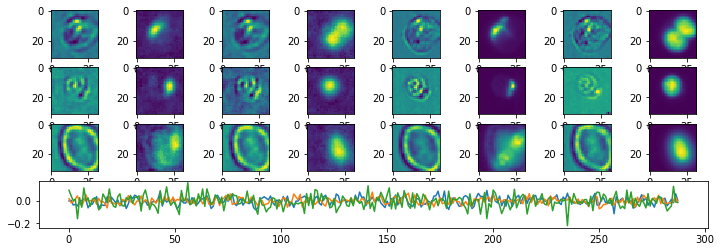

Epoch:  44 Iteration:  0 Loss:  3.23981 0.629858 0.000593007


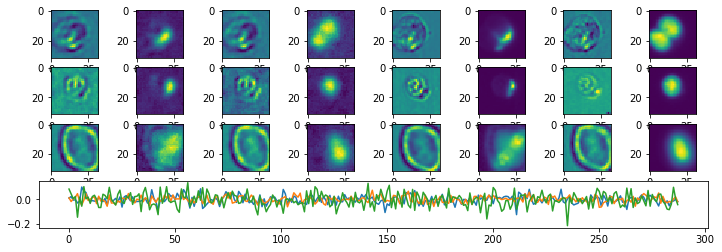

Epoch:  45 Iteration:  0 Loss:  3.18913 0.629832 0.000619799


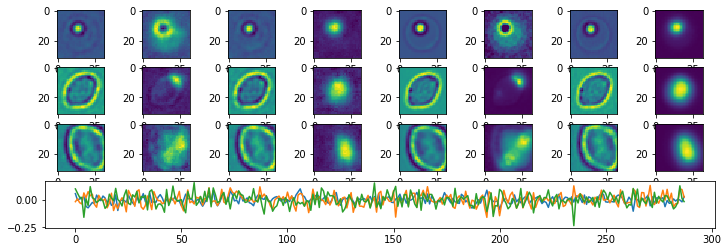

Epoch:  46 Iteration:  0 Loss:  3.18569 0.62983 0.000634372


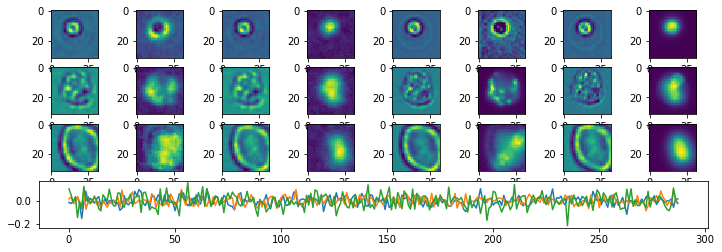

Epoch:  47 Iteration:  0 Loss:  3.12863 0.629801 0.000718087


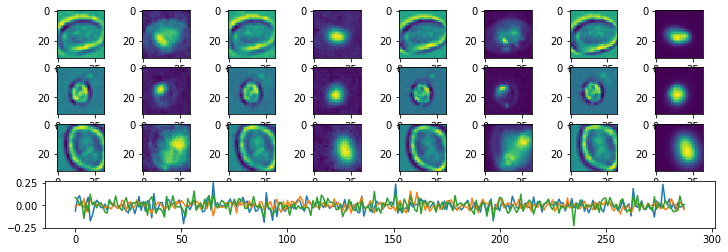

Epoch:  48 Iteration:  0 Loss:  3.08641 0.62978 0.000407875


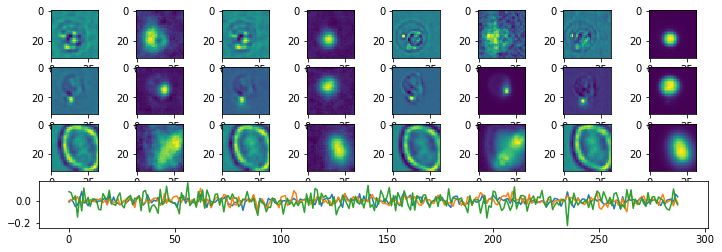

Epoch:  49 Iteration:  0 Loss:  3.0431 0.629758 1.04904e-05


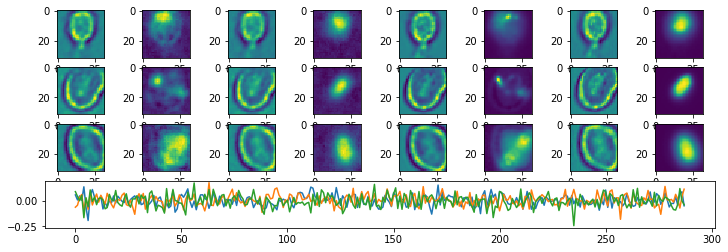

Epoch:  50 Iteration:  0 Loss:  3.05001 0.62976 0.000486016


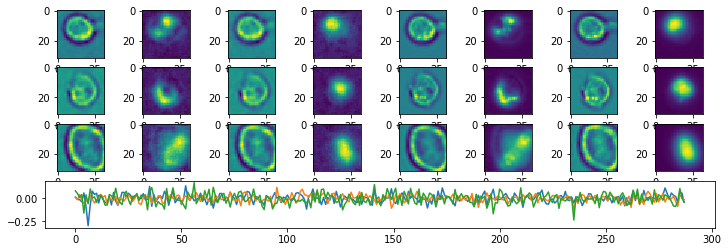

Epoch:  51 Iteration:  0 Loss:  2.96908 0.629721 0.000401586


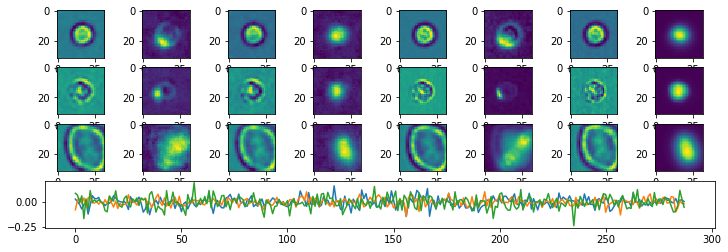

Epoch:  52 Iteration:  0 Loss:  3.04652 0.629758 0.00100824


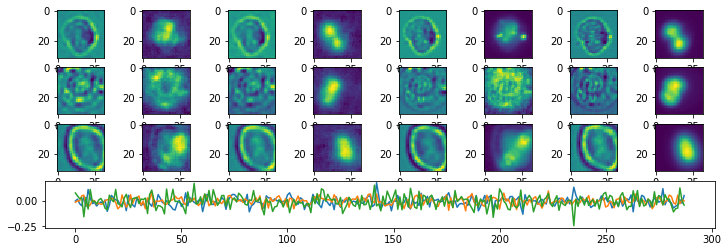

Epoch:  53 Iteration:  0 Loss:  2.8976 0.629682 0.000665933


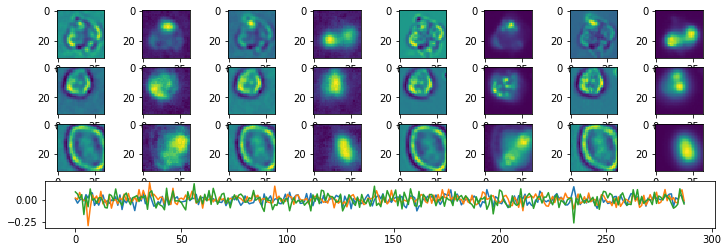

Epoch:  54 Iteration:  0 Loss:  3.0237 0.629749 0.000525743


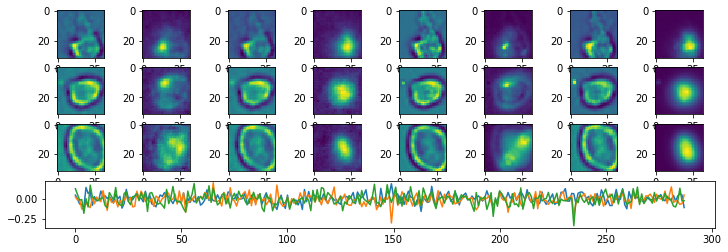

Epoch:  55 Iteration:  0 Loss:  2.90907 0.629689 0.000415802


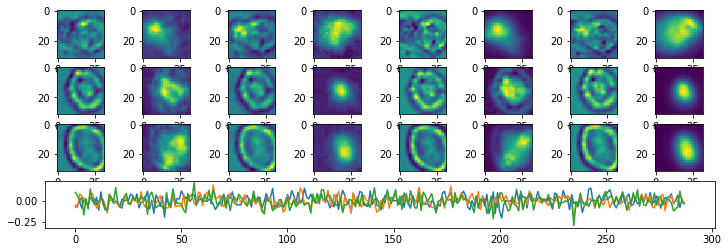

Epoch:  56 Iteration:  0 Loss:  2.88196 0.629674 0.000346541


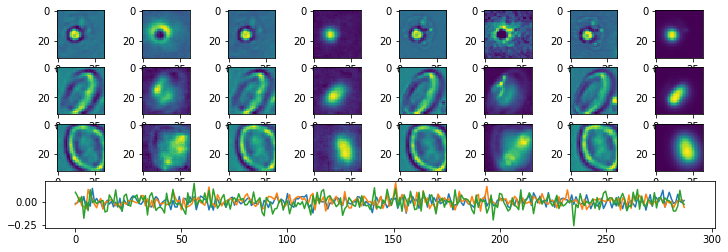

Epoch:  57 Iteration:  0 Loss:  2.85676 0.629663 0.000545412


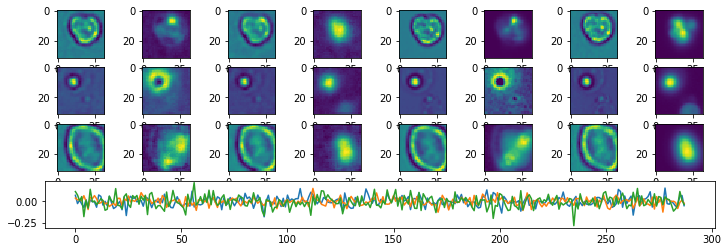

Epoch:  58 Iteration:  0 Loss:  2.85505 0.62966 0.000704467


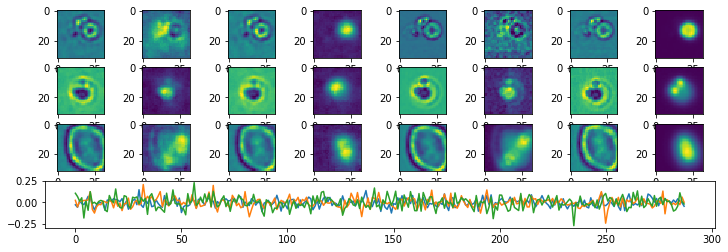

Epoch:  59 Iteration:  0 Loss:  2.82696 0.629646 0.00044322


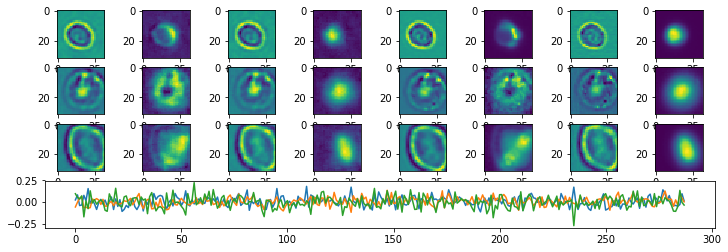

Epoch:  60 Iteration:  0 Loss:  2.79924 0.629632 0.000738114


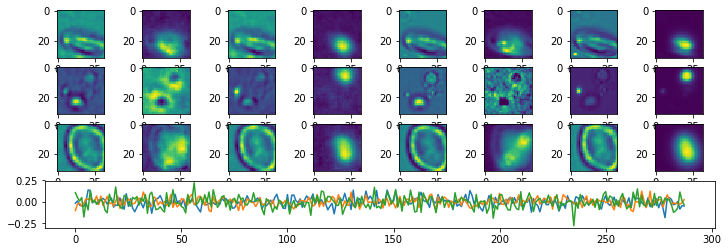

Epoch:  61 Iteration:  0 Loss:  2.76097 0.629612 0.000380188


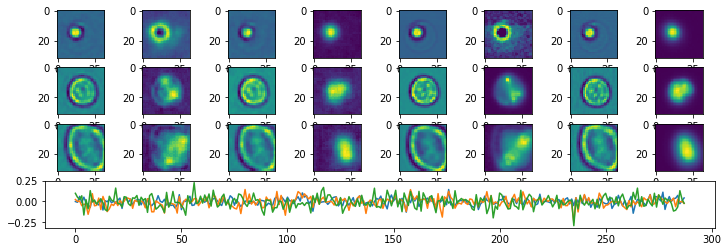

Epoch:  62 Iteration:  0 Loss:  2.76116 0.629613 0.000401229


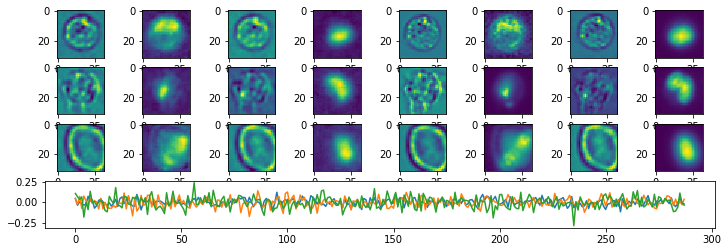

Epoch:  63 Iteration:  0 Loss:  2.72113 0.629592 0.000157893


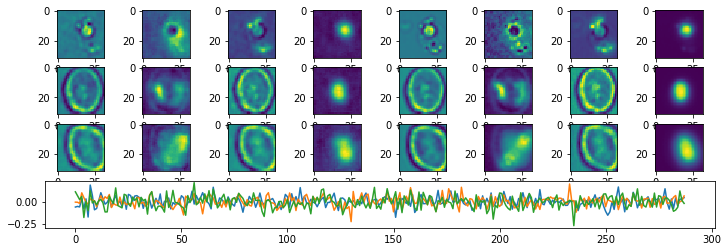

Epoch:  64 Iteration:  0 Loss:  2.70484 0.629585 0.000480086


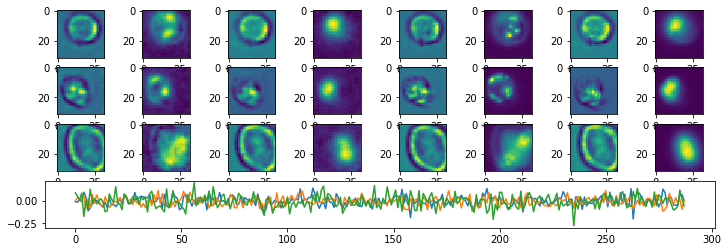

Epoch:  65 Iteration:  0 Loss:  2.68792 0.629575 9.74238e-05


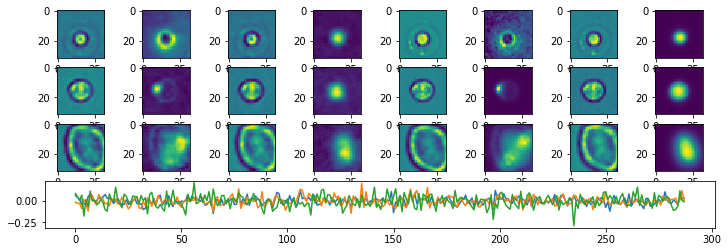

Epoch:  66 Iteration:  0 Loss:  2.65534 0.629558 0.000201464


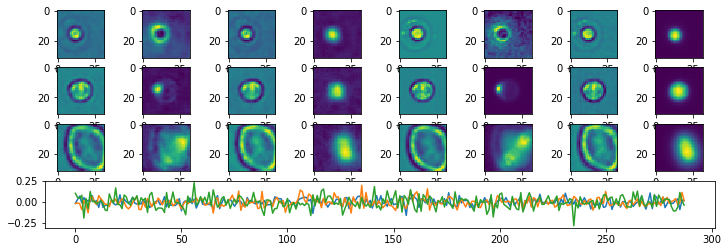

Epoch:  67 Iteration:  0 Loss:  2.64156 0.629551 8.9407e-05


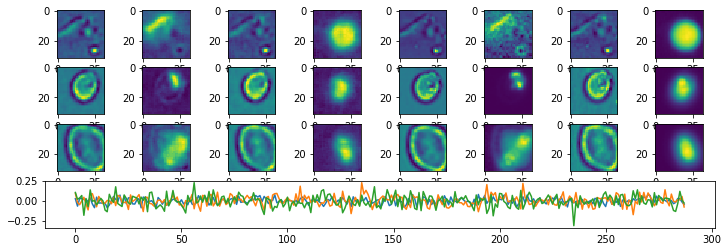

Epoch:  68 Iteration:  0 Loss:  2.64815 0.629557 0.000847965


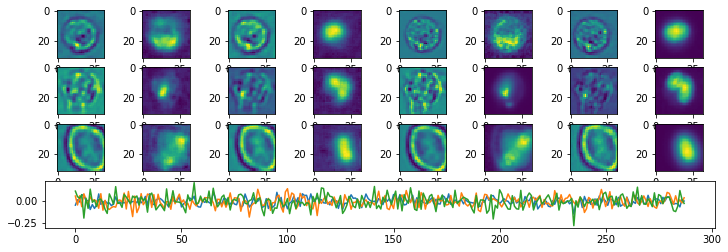

Epoch:  69 Iteration:  0 Loss:  2.57798 0.629519 0.000531554


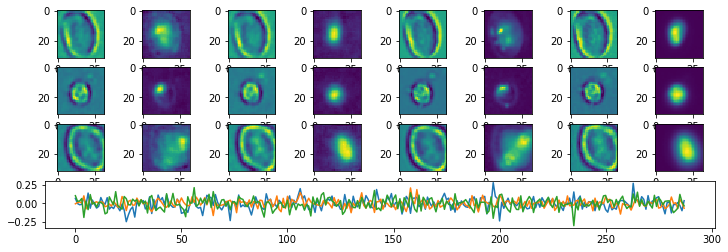

Epoch:  70 Iteration:  0 Loss:  2.59162 0.629527 0.000472635


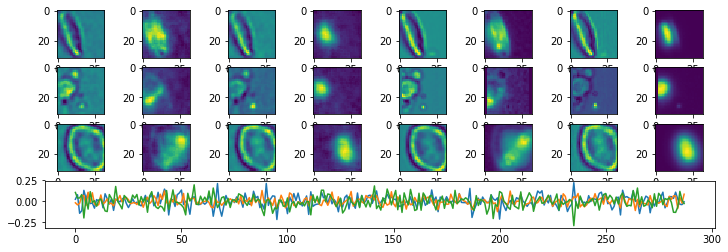

Epoch:  71 Iteration:  0 Loss:  2.55918 0.629509 0.000402868


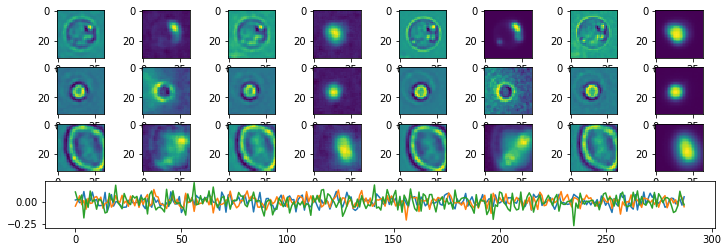

Epoch:  72 Iteration:  0 Loss:  2.54715 0.629504 0.000355303


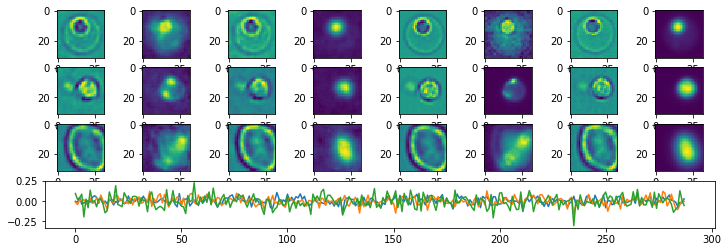

Epoch:  73 Iteration:  0 Loss:  2.52517 0.629491 8.61883e-05


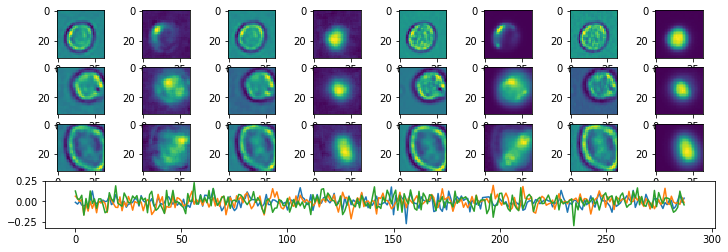

Epoch:  74 Iteration:  0 Loss:  2.51061 0.629484 0.00036937


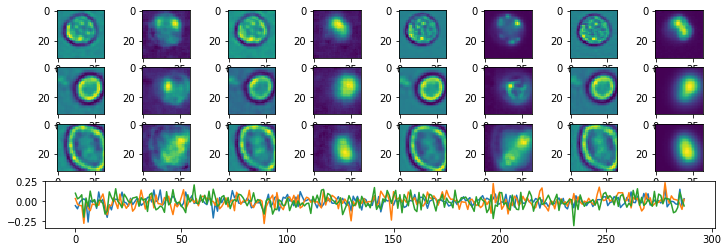

Epoch:  75 Iteration:  0 Loss:  2.49352 0.629476 0.000158012


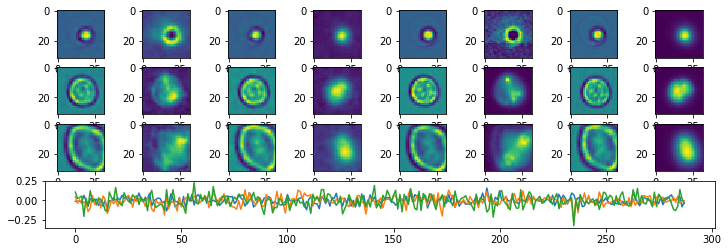

Epoch:  76 Iteration:  0 Loss:  2.48639 0.629471 0.00017643


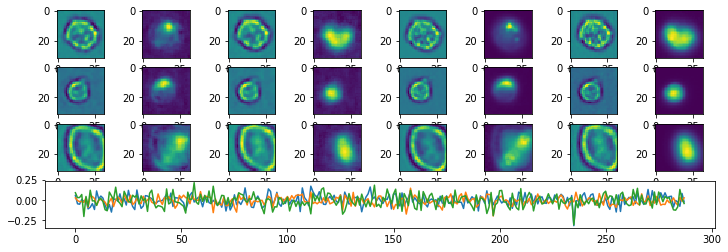

Epoch:  77 Iteration:  0 Loss:  2.47933 0.629468 0.000150472


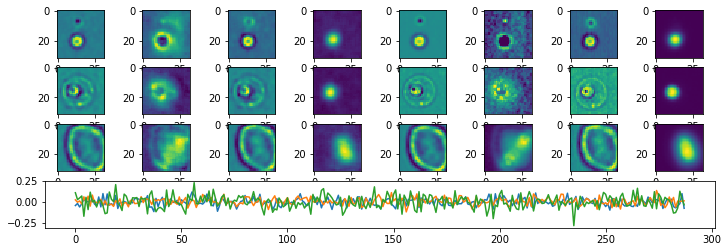

Epoch:  78 Iteration:  0 Loss:  2.44846 0.629452 0.000155538


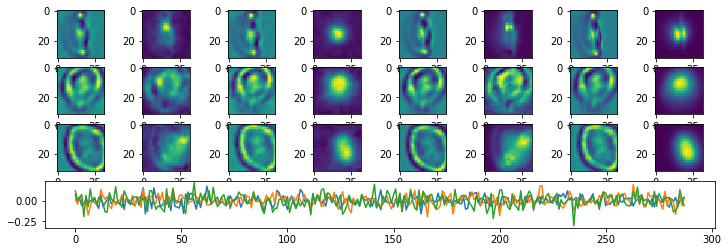

Epoch:  79 Iteration:  0 Loss:  2.43841 0.629446 0.000205874


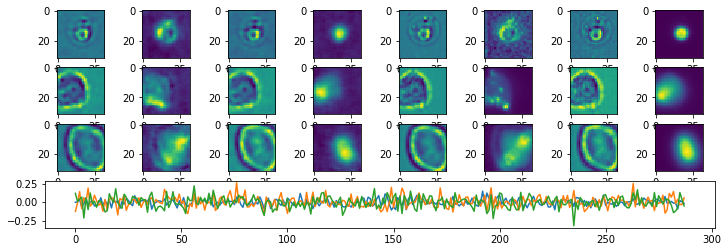

Epoch:  80 Iteration:  0 Loss:  2.42668 0.62944 0.000344008


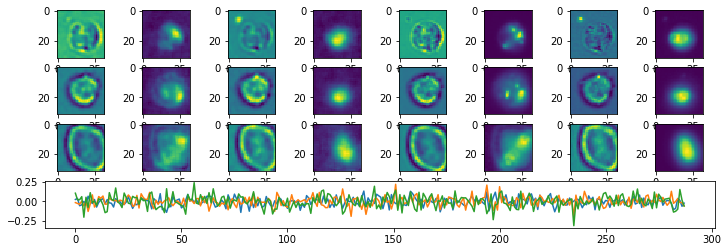

Epoch:  81 Iteration:  0 Loss:  2.8706 0.629676 0.000331014


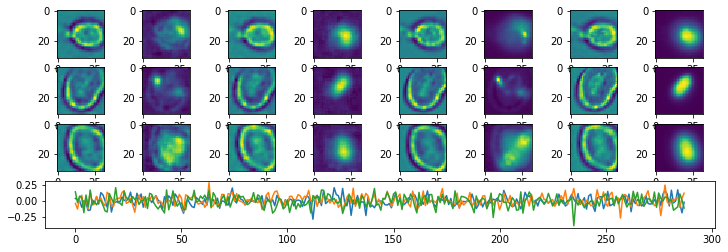

Epoch:  82 Iteration:  0 Loss:  2.67796 0.629573 0.00028488


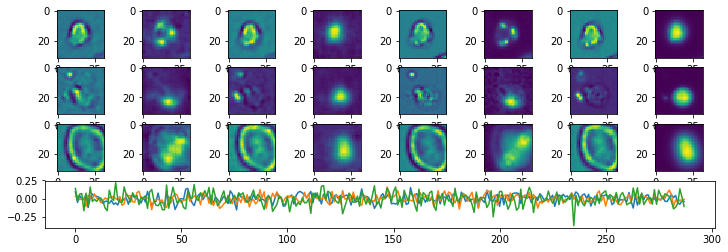

Epoch:  83 Iteration:  0 Loss:  2.60644 0.629535 0.000255466


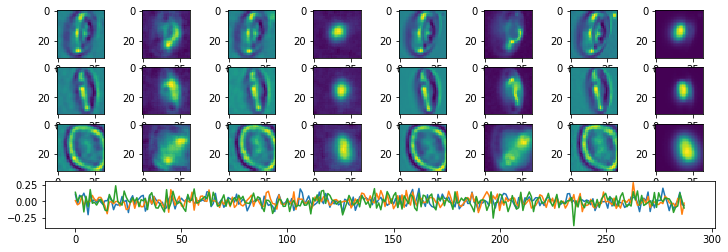

Epoch:  84 Iteration:  0 Loss:  2.57955 0.629523 0.000417352


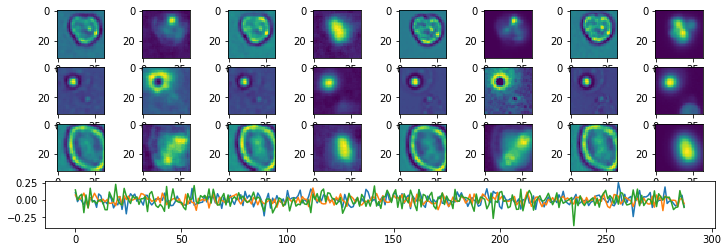

Epoch:  85 Iteration:  0 Loss:  2.51488 0.629487 0.000249982


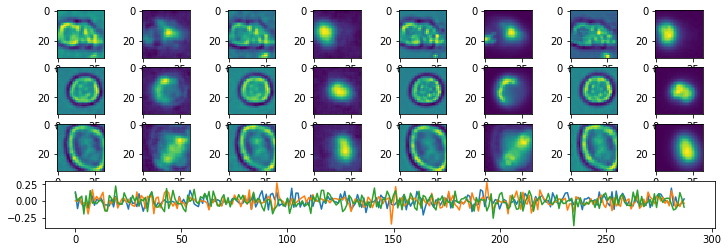

Epoch:  86 Iteration:  0 Loss:  2.5265 0.629492 0.000420123


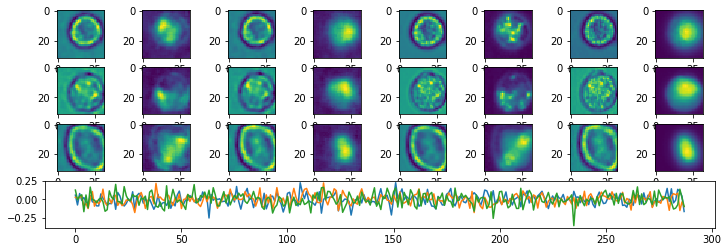

Epoch:  87 Iteration:  0 Loss:  2.50471 0.629482 0.000376076


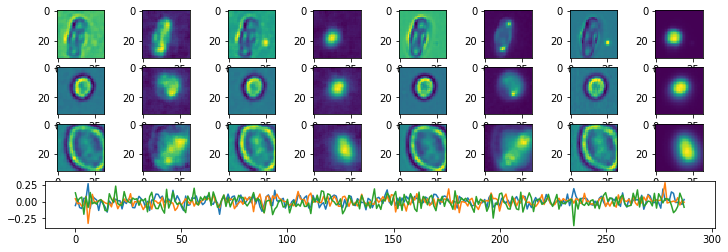

Epoch:  88 Iteration:  0 Loss:  2.49024 0.629474 0.000392973


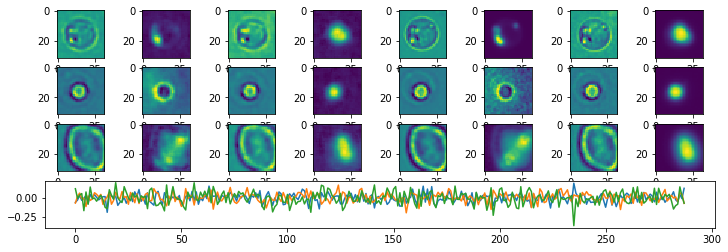

Epoch:  89 Iteration:  0 Loss:  2.48138 0.62947 0.000347763


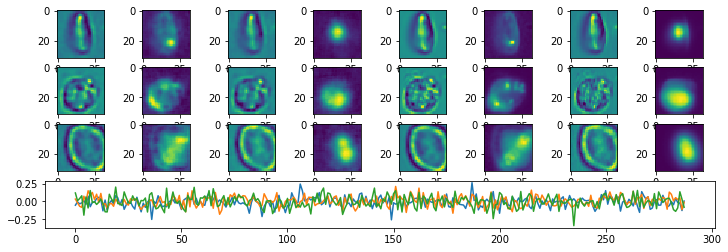

Epoch:  90 Iteration:  0 Loss:  2.46645 0.629461 0.00036785


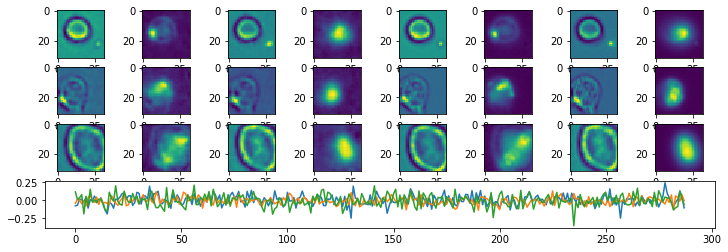

Epoch:  91 Iteration:  0 Loss:  2.44134 0.629448 0.000340283


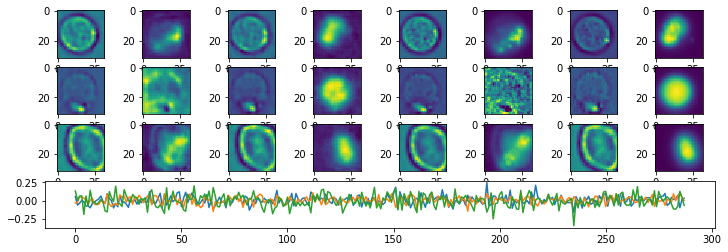

Epoch:  92 Iteration:  0 Loss:  2.45405 0.629456 0.000356972


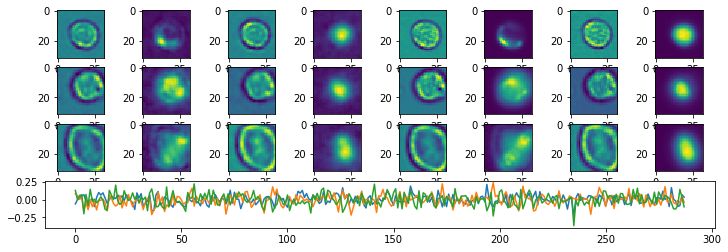

Epoch:  93 Iteration:  0 Loss:  2.4459 0.62945 0.000379294


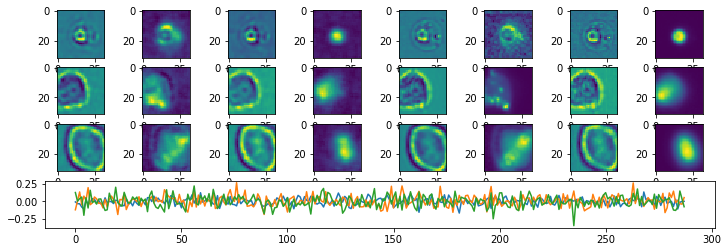

Epoch:  94 Iteration:  0 Loss:  2.4432 0.62945 0.000388175


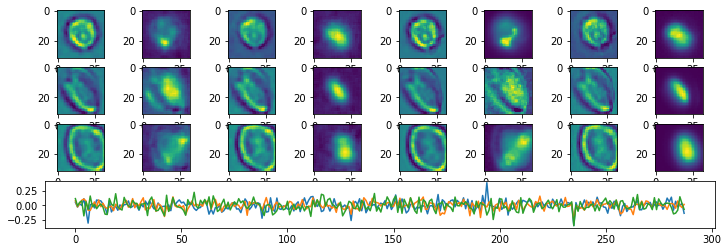

Epoch:  95 Iteration:  0 Loss:  2.42271 0.629439 0.000322014


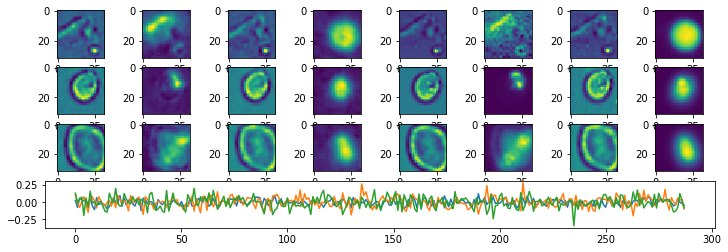

Epoch:  96 Iteration:  0 Loss:  2.42974 0.629445 0.0004628


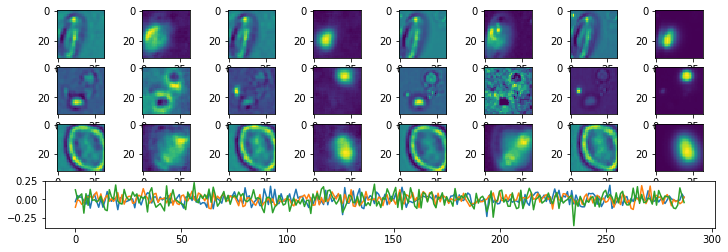

Epoch:  97 Iteration:  0 Loss:  2.41954 0.629436 0.000502735


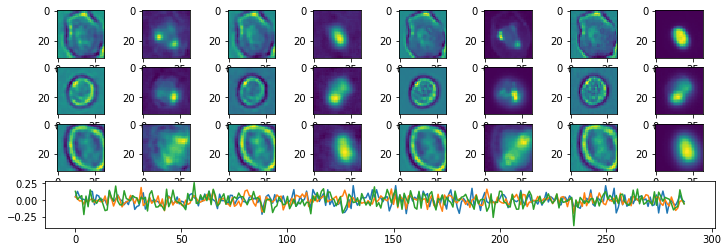

Epoch:  98 Iteration:  0 Loss:  2.4028 0.629427 0.000443727


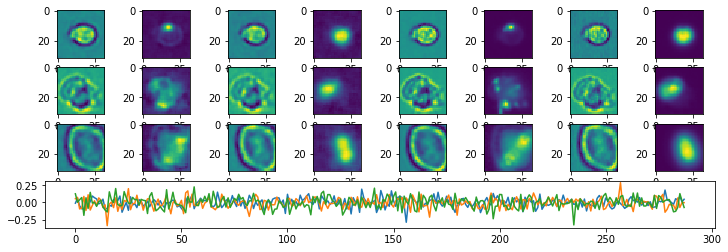

Epoch:  99 Iteration:  0 Loss:  2.3982 0.629426 0.000240624


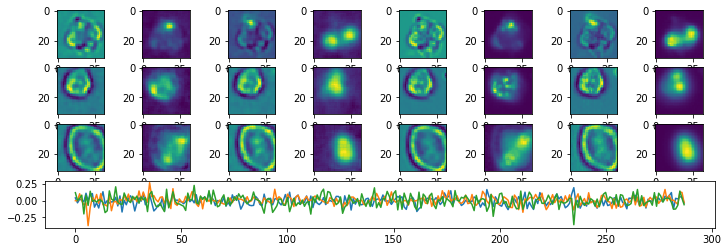

Epoch:  100 Iteration:  0 Loss:  2.39682 0.629424 0.000445336


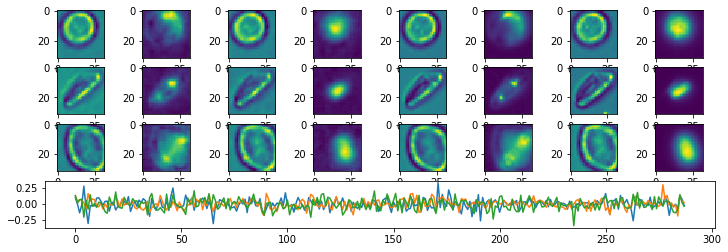

Epoch:  101 Iteration:  0 Loss:  2.41234 0.629434 0.00016889


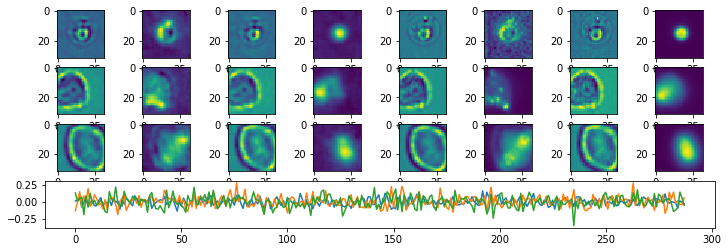

Epoch:  102 Iteration:  0 Loss:  2.37569 0.629414 9.27448e-05


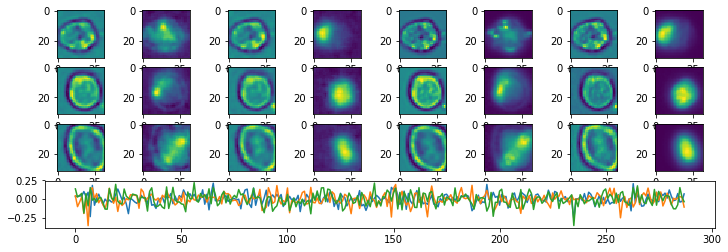

Epoch:  103 Iteration:  0 Loss:  2.39015 0.629421 0.000500858


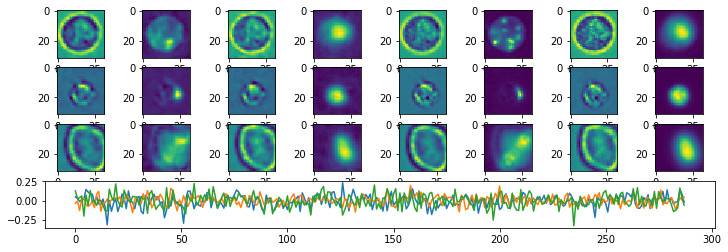

Epoch:  104 Iteration:  0 Loss:  2.36387 0.629407 0.000275582


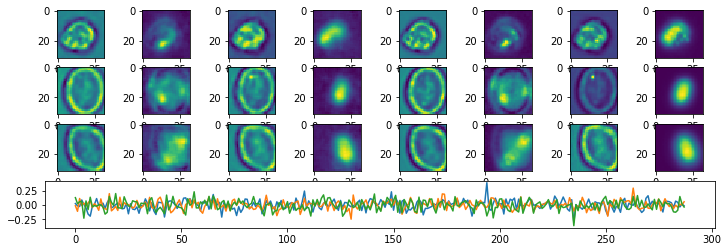

Epoch:  105 Iteration:  0 Loss:  2.35936 0.629405 0.000185043


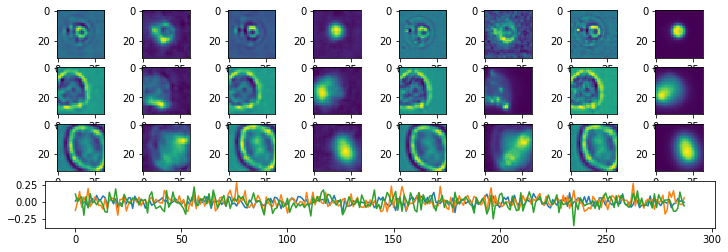

Epoch:  106 Iteration:  0 Loss:  2.36769 0.62941 8.21054e-05


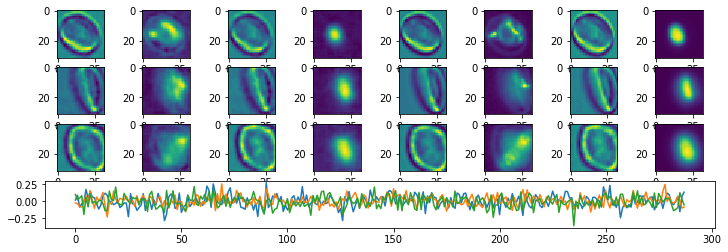

Epoch:  107 Iteration:  0 Loss:  2.35558 0.629405 3.6031e-05


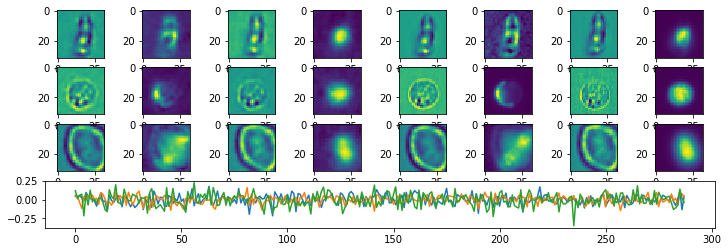

Epoch:  108 Iteration:  0 Loss:  2.35592 0.629404 8.06749e-05


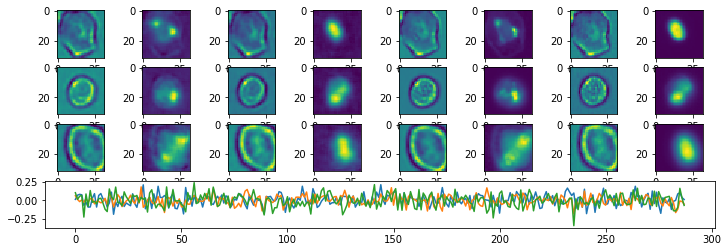

Epoch:  109 Iteration:  0 Loss:  2.33927 0.629394 0.00051558


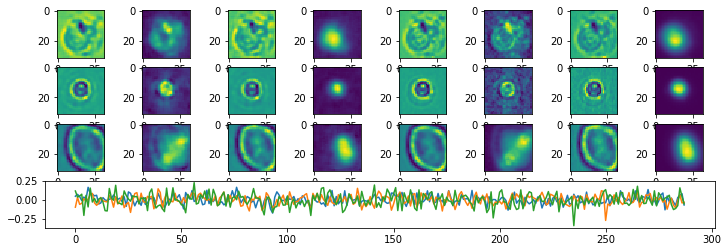

Epoch:  110 Iteration:  0 Loss:  2.3326 0.629392 0.000494897


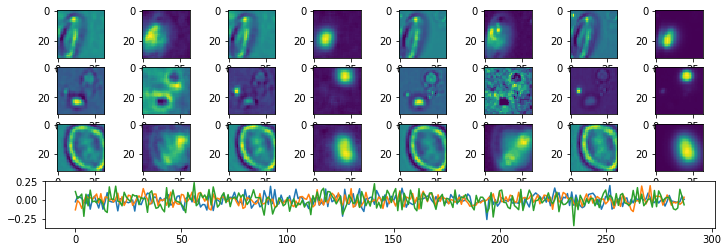

Epoch:  111 Iteration:  0 Loss:  2.33022 0.62939 0.000340402


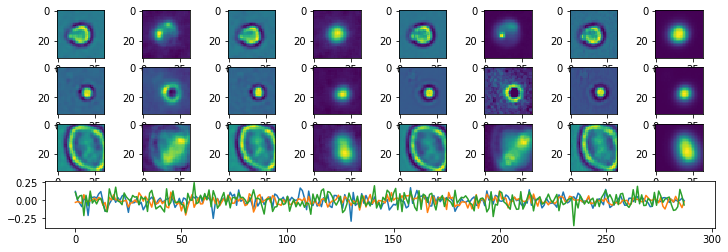

Epoch:  112 Iteration:  0 Loss:  2.3232 0.629387 0.000371456


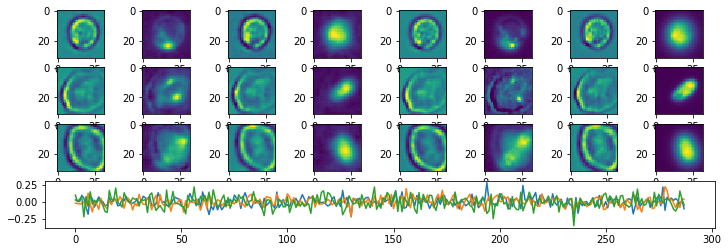

Epoch:  113 Iteration:  0 Loss:  2.30827 0.629379 0.000347555


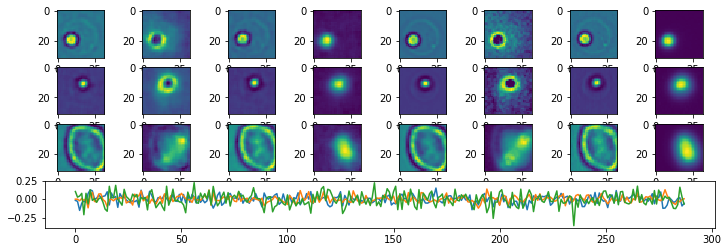

Epoch:  114 Iteration:  0 Loss:  2.31286 0.629381 0.000208855


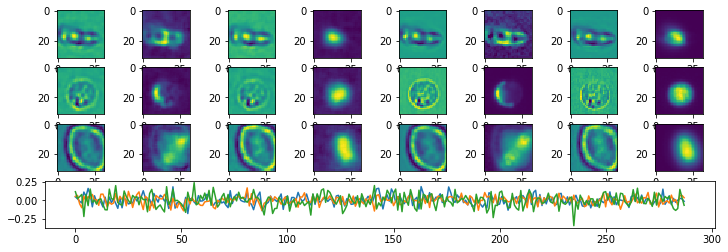

Epoch:  115 Iteration:  0 Loss:  2.30174 0.629375 0.000304043


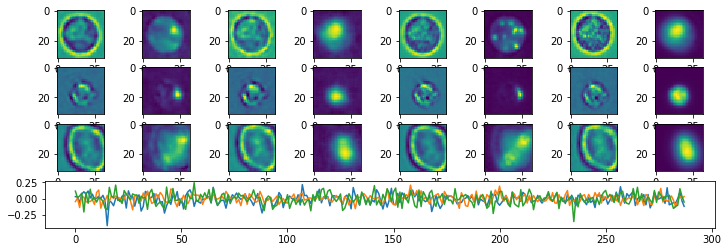

Epoch:  116 Iteration:  0 Loss:  2.31554 0.629384 0.00042361


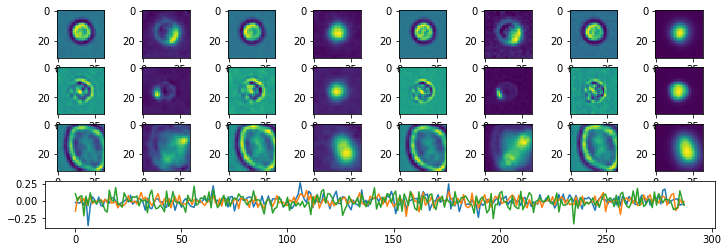

Epoch:  117 Iteration:  0 Loss:  2.2918 0.62937 0.000306457


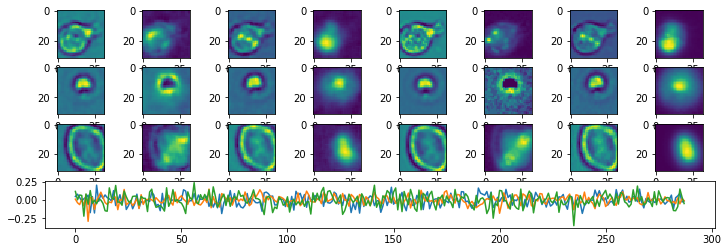

Epoch:  118 Iteration:  0 Loss:  2.29444 0.629372 9.93609e-05


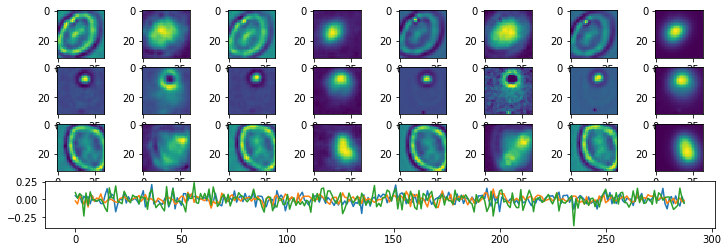

Epoch:  119 Iteration:  0 Loss:  2.28426 0.629367 0.000358492


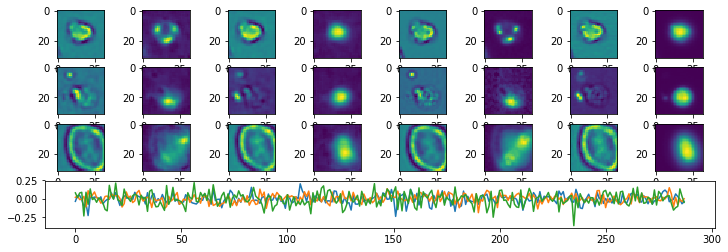

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 288 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-25-LS288"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4